In [1]:
## Requires condaScanpy1_6_0.yaml

import scvelo as scv
import scanpy as sc
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import glob
import os
from scipy import stats
from scipy.stats import ks_2samp
import matplotlib.colors as colors
import matplotlib.cm as cmx
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

## Make text Arial and editable in Illustrator
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.sans-serif'] = "Arial"
matplotlib.rcParams['font.family'] = "sans-serif"

## Palettes: https://jiffyclub.github.io/palettable/wesanderson/
from palettable.wesanderson import Zissou_5
from palettable.wesanderson import GrandBudapest3_6

os.chdir('./')
figdir='./figures/'
scv.settings.set_figure_params('scvelo', color_map='cividis')

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
cd4 = sc.read('Fig1_2_filteredGEX_velocyto_processed.h5ad')
cd4

AnnData object with n_obs × n_vars = 5427 × 5281
    obs: 'batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'sample_batch', 'sample', 'n_genes', 'n_counts', 'log_counts', 'percent_mito', 'leiden', 'leiden_r1', 'leiden_r0.9', 'velocity_self_transition', 'umap_density_sample'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'velocity_gamma', 'velocity_r2', 'velocity_genes'
    uns: 'hvg', 'leiden', 'leiden_colors', 'leiden_r0.9_colors', 'leiden_r1_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_colors', 'umap', 'umap_density_sample_params', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced', 'variance_velocity', 'velocity'
    obsp: 'connectivities', 'distances'

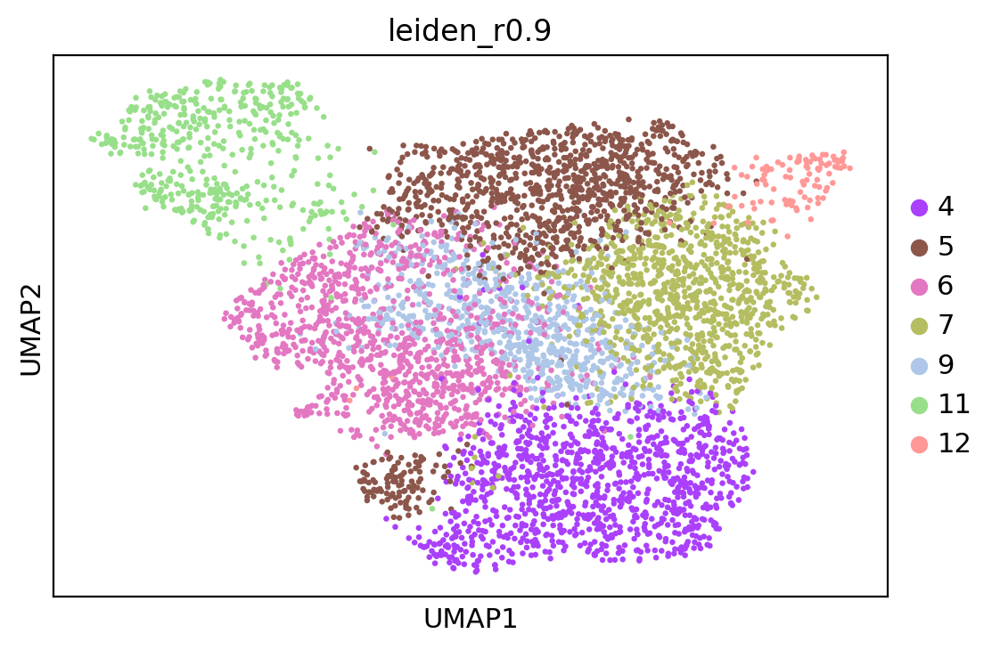

In [3]:
sc.pl.umap(cd4, color='leiden_r0.9')

In [4]:
sgenes=["Mcm4", "Exo1", "Slbp", "Gmnn", "Cdc45", "Msh2", "Mcm6", "Rrm2", "Pold3", "Blm", "Ubr7", "Mcm5", "Clspn", "Hells", "Nasp", "Rpa2", "Rad51ap1", "Tyms", "Rrm1", "Rfc2", "Prim1", "Brip1", "Usp1", "Ung",  "Pola1", "Mcm2", "Fen1", "Tipin", "Pcna", "Cdca7", "Uhrf1", "Casp8ap2", "Cdc6", "Dscc1", "Wdr76", "E2f8", "Dtl",  "Ccne2", "Atad2", "Gins2","Chaf1b", "Pcna-ps2"]
g2mgenes=[ "Nuf2",  "Psrc1", "Ncapd2","Ccnb2", "Smc4",  "Lbr","Tacc3", "Cenpa", "Kif23", "Cdca2", "Anp32e", "G2e3",  "Cdca3", "Anln",  "Cenpe", "Gas2l3",  "Tubb4b",  "Cenpf", "Dlgap5",  "Hjurp", "Cks1brt", "Gtse1", "Bub1",  "Birc5", "Ube2c", "Rangap1", "Hmmr",  "Ect2",  "Tpx2",  "Ckap5", "Cbx5",  "Nek2",  "Ttk",  "Cdca8", "Nusap1",  "Ctcf",  "Cdc20", "Cks2",  "Mki67", "Tmpo",  "Ckap2l" , "Aurkb", "Kif2c", "Cdk1", "Kif20b" , "Top2a", "Aurka", "Ckap2", "Hmgb2", "Cdc25c" , "Ndc80", "Kif11"]

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


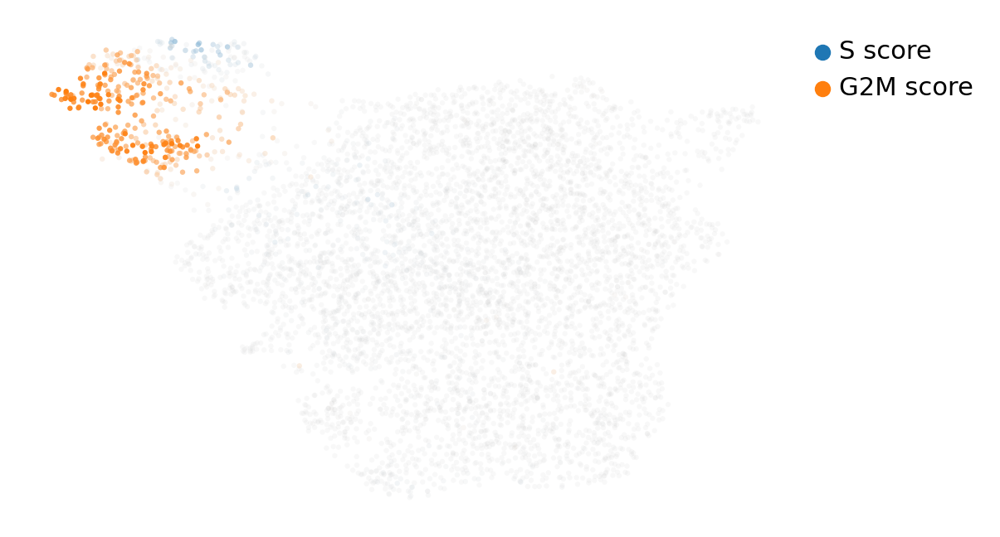

In [5]:
scv.tl.score_genes_cell_cycle(cd4, s_genes=sgenes, g2m_genes=g2mgenes)
scv.pl.scatter(cd4, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95])

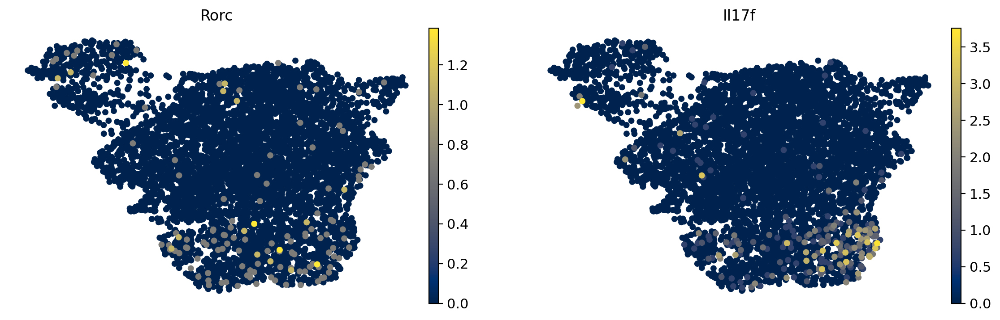

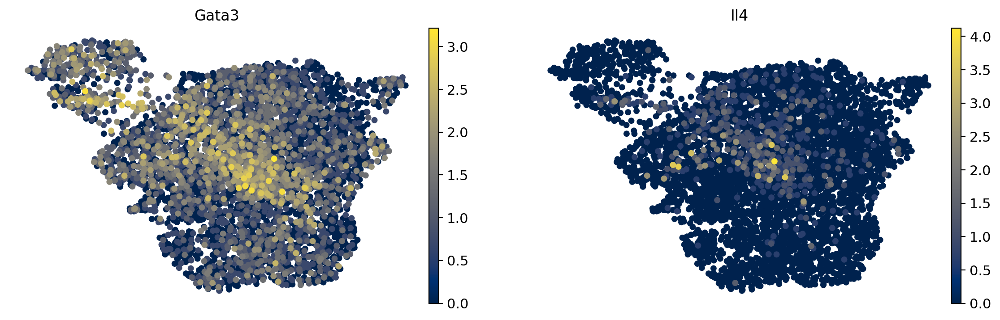

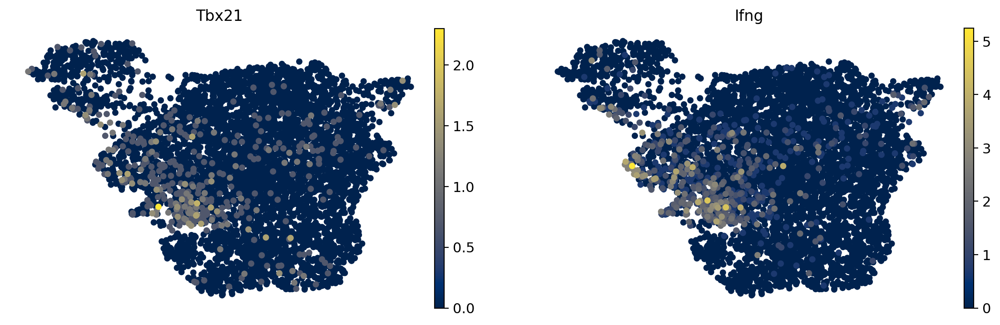

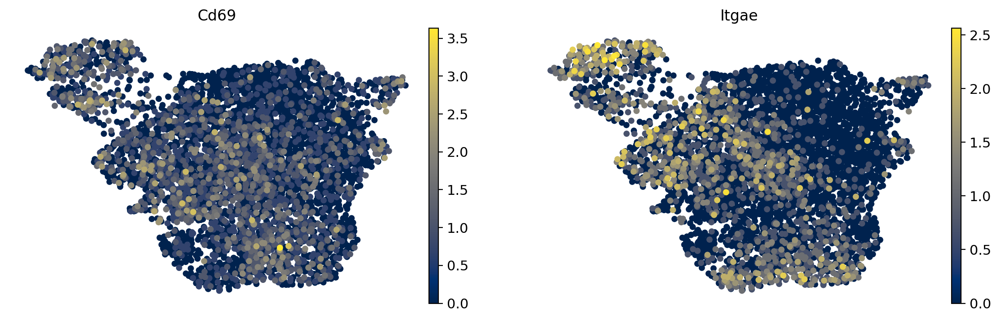

In [6]:
sc.pl.umap(cd4, color=['Rorc','Il17f'], frameon=False, legend_loc='right', size=100)
sc.pl.umap(cd4, color=['Gata3','Il4'], frameon=False, legend_loc='right', size=100)
sc.pl.umap(cd4, color=['Tbx21','Ifng'], frameon=False, legend_loc='right', size=100)
sc.pl.umap(cd4, color=['Cd69','Itgae'], frameon=False, legend_loc='right', size=100)

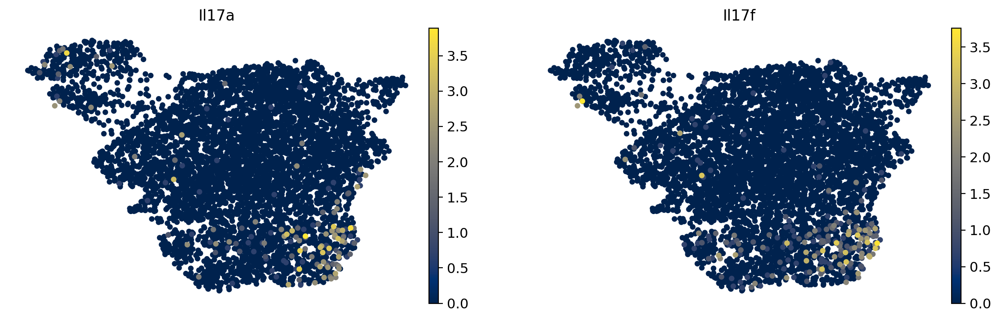

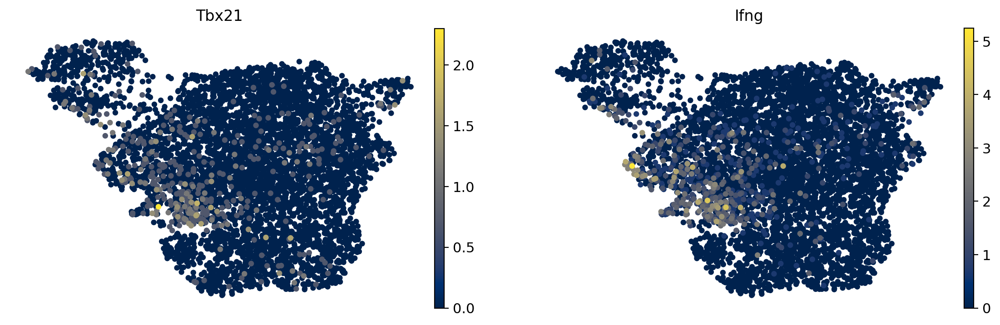

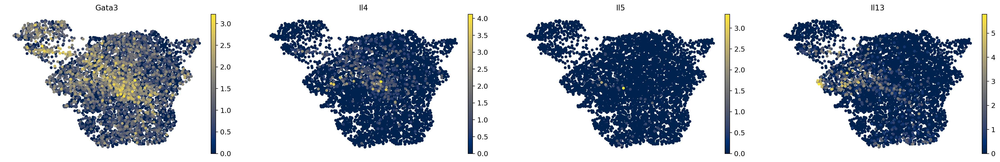

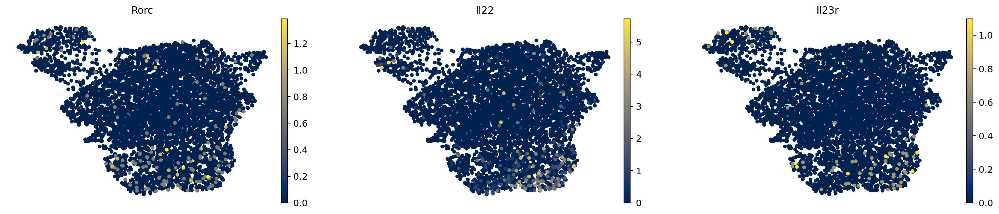

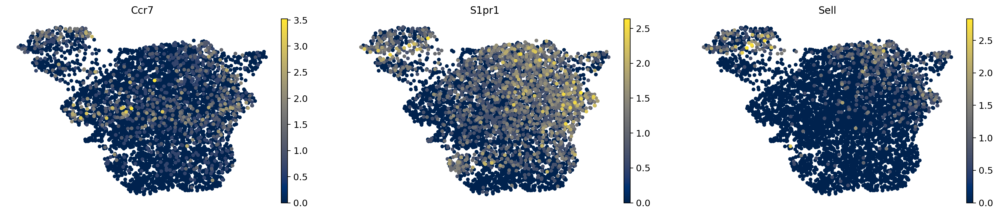

In [7]:
sc.pl.umap(cd4, color=['Il17a','Il17f'], size=80, frameon=False)
sc.pl.umap(cd4, color=['Tbx21','Ifng'], size=80, frameon=False)
sc.pl.umap(cd4, color=['Gata3','Il4','Il5','Il13'], size=80, frameon=False)
sc.pl.umap(cd4, color=['Rorc','Il22','Il23r'], size=80, frameon=False)
sc.pl.umap(cd4, color=['Ccr7','S1pr1','Sell'], size=80, frameon=False)

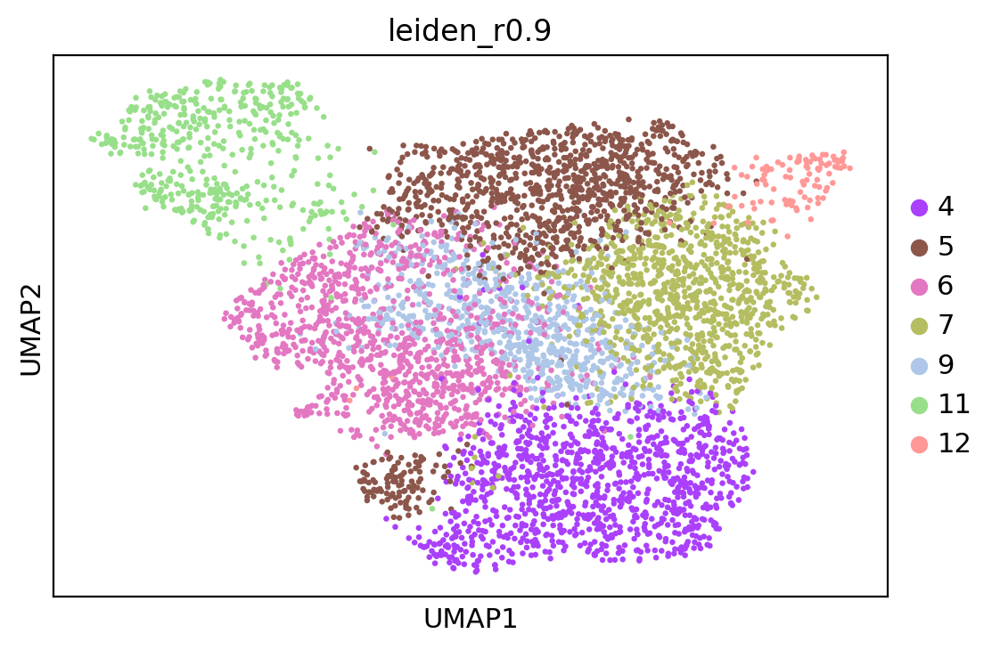

In [8]:
sc.pl.umap(cd4, color='leiden_r0.9')

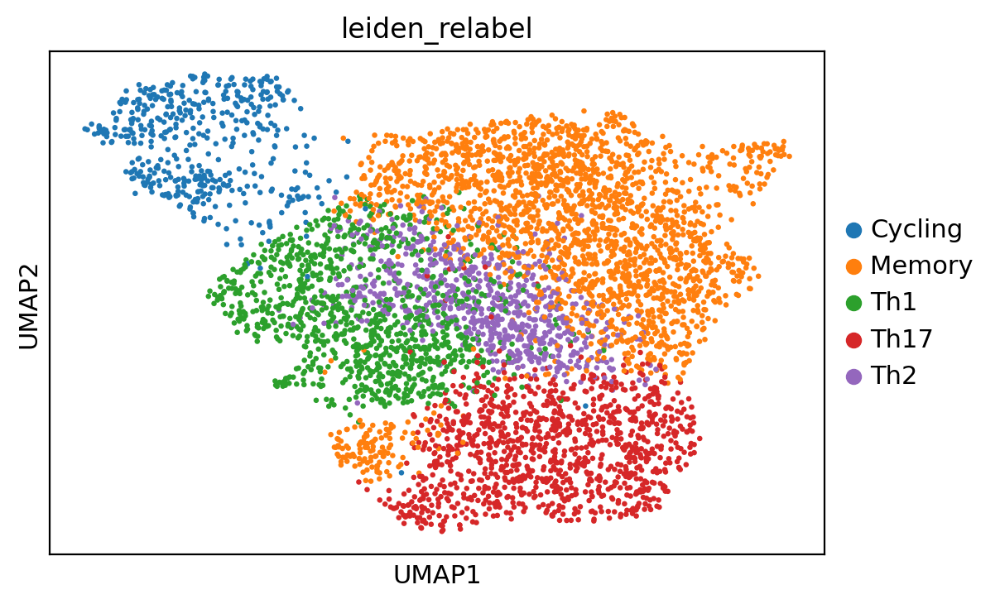

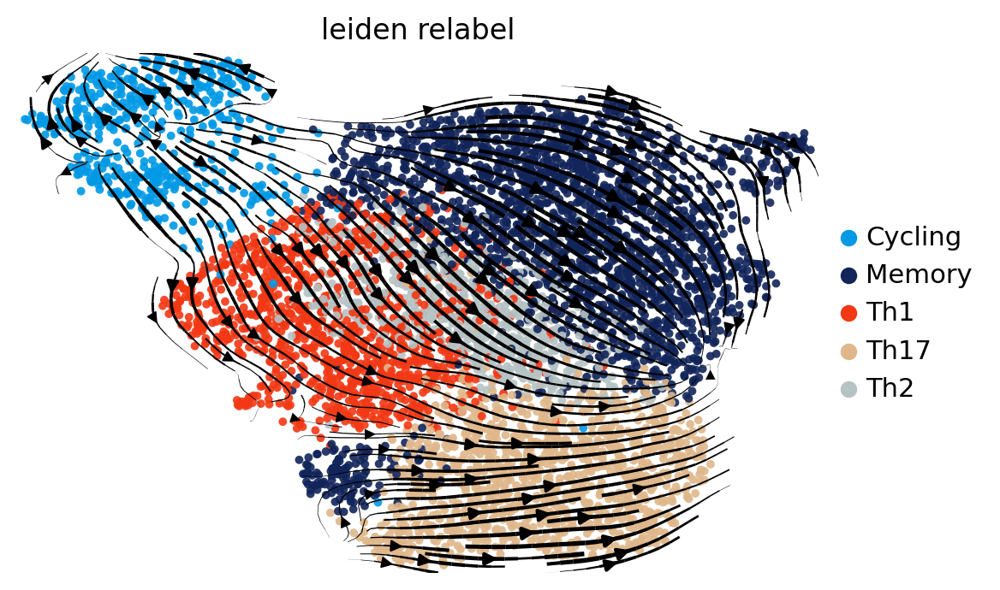

In [9]:
oldToNew = {
    '11':'Cycling',
    '6':'Th1',
    '4':'Th17',
    '9':'Th2',
    '5':'Memory',
    '7':'Memory',
    '12':'Memory'}
cd4.obs['leiden_relabel'] = (
    cd4.obs['leiden_r0.9']
    .map(oldToNew)
    .astype('category')
)
sc.pl.umap(cd4, color='leiden_relabel')
scv.pl.velocity_embedding_stream(cd4, color='leiden_relabel', legend_loc='right', size=50, alpha=0.9, palette=Zissou_5.hex_colors)

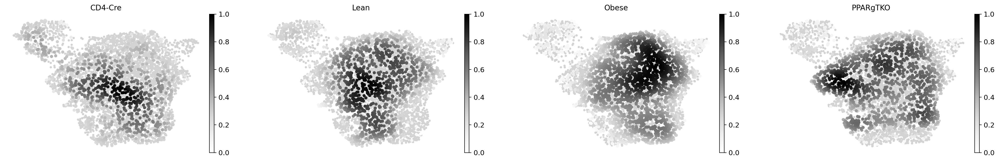

In [10]:
sc.tl.embedding_density(cd4, basis='umap', groupby='sample')
sc.pl.embedding_density(cd4, basis='umap', groupby='sample', color_map='Greys', frameon=False, fg_dotsize=100, bg_dotsize=50)

... storing 'leiden_relabel' as categorical


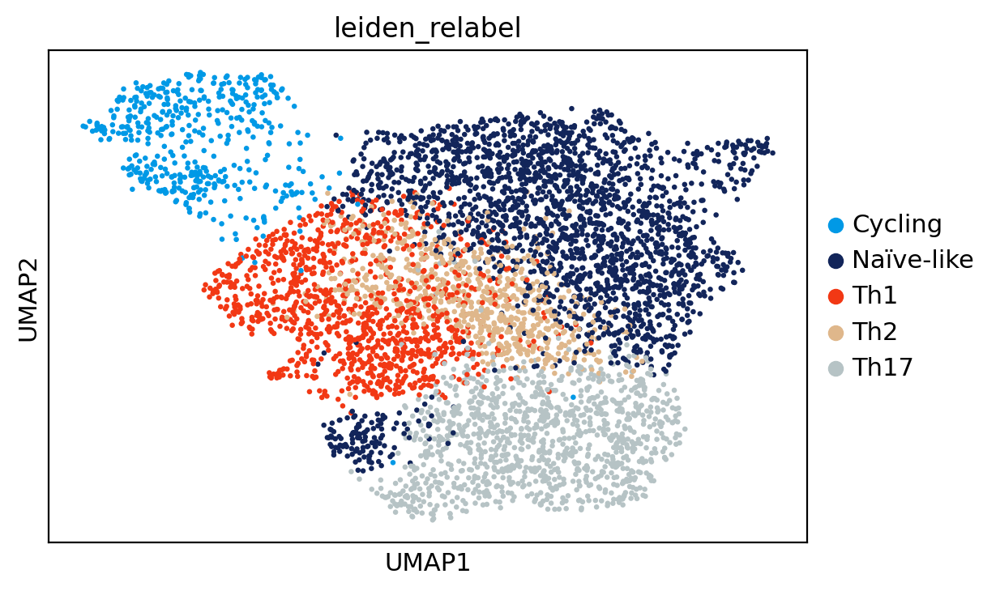

In [11]:
## Rename Memory to Naive-Like based on gene expr 
cd4.obs['leiden_relabel'] = cd4.obs['leiden_relabel'].replace({'Memory':'Naïve-like'})
sc.pl.umap(cd4, color='leiden_relabel')
# cd4.write('Fig1_2_filteredGEX_velocyto_processed_relabeled.h5ad')

## Load processed data for plotting

In [12]:
# cd4 = sc.read('Fig1_2_filteredGEX_velocyto_processed_relabeled.h5ad')

## File above renamed to file below for publication release in GEO

cd4 = sc.read('GSE189476_Figures1_2_merged.h5ad')
cd4

AnnData object with n_obs × n_vars = 5427 × 5281
    obs: 'batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'sample_batch', 'sample', 'n_genes', 'n_counts', 'log_counts', 'percent_mito', 'leiden', 'leiden_r1', 'leiden_r0.9', 'leiden_r0.75', 'leiden_r0.5', 'leiden_r0.25', 'velocity_self_transition', 'umap_density_sample', 'S_score', 'G2M_score', 'phase', 'clusters_gradients', 'leiden_relabel'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'velocity_gamma', 'velocity_r2', 'velocity_genes'
    uns: 'clusters_gradients_colors', 'hvg', 'leiden', 'leiden_colors', 'leiden_r0.25_colors', 'leiden_r0.5_colors', 'leiden_r0.75_colors', 'leiden_r0.9_colors', 'leiden_r1_colors', 'leiden_relabel_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_colors', 'umap', 'umap_density_sample_params', 'velocity_graph', 'veloci

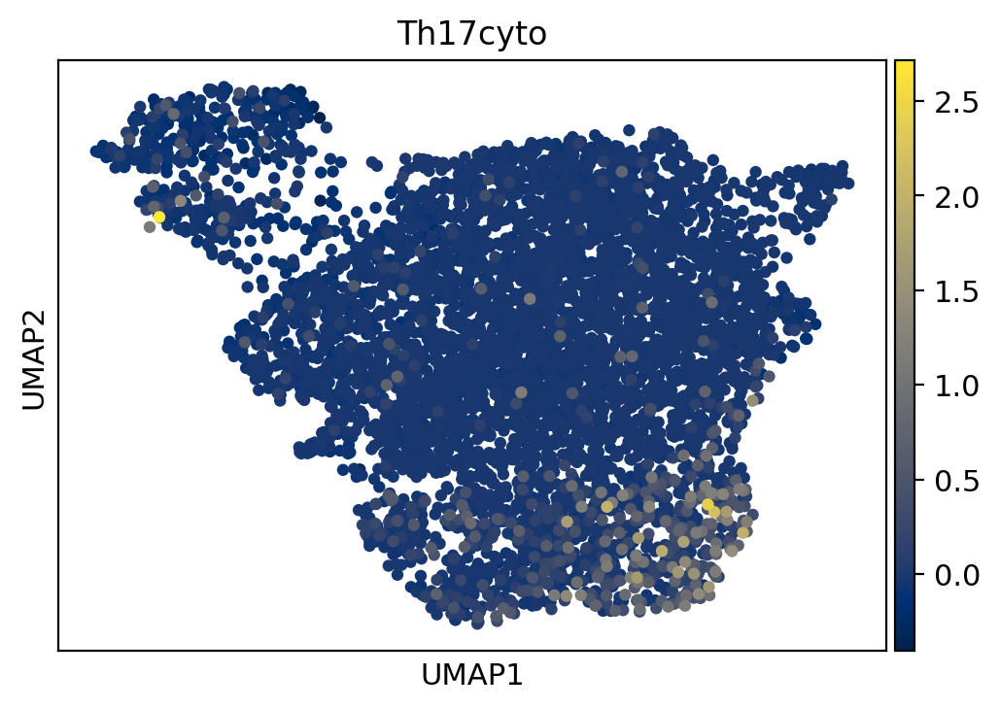

In [13]:
sc.tl.score_genes(cd4, gene_list=['Il17a','Il17f','Il22','Il23r'], score_name='Th17cyto')
sc.pl.umap(cd4, color='Th17cyto', size=80)

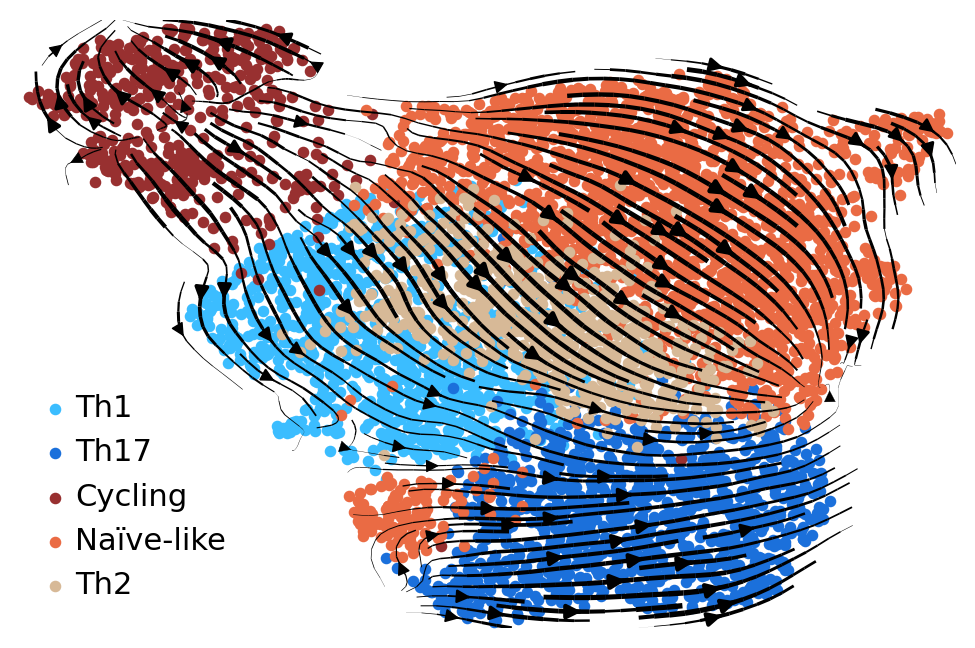

In [14]:
## Rearrange plot ordering so Th2 cluster on top

## https://stackoverflow.com/questions/28033046/matplotlib-scatter-color-by-categorical-factors
df = cd4.obs
df_umap = df.join(pd.DataFrame(cd4.obsm['X_umap'], index=df.index).rename(columns={0: "UMAP_1", 1: "UMAP_2"}))

fig, ax = plt.subplots()
size=20

# Pull out dimensions for scatterplot
x=df_umap['UMAP_1']
y=df_umap['UMAP_2']

# Get unique names of clusters for coloring
uniq=['Th1','Th17','Cycling','Naïve-like','Th2']
# Set the color map to match the number of species
z = range(1,len(uniq))
hot = Zissou_5.mpl_colormap
cNorm  = colors.Normalize(vmin=0, vmax=len(uniq))
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=hot)


##https://stackoverflow.com/questions/37765197/darken-or-lighten-a-color-in-matplotlib/49601444
def lighten_color(color, amount=0.5):
    """
    Lightens the given color by multiplying (1-luminosity) by the given amount.
    Input can be matplotlib color string, hex string, or RGB tuple.

    Examples:
    >> lighten_color('g', 0.3)
    >> lighten_color('#F034A3', 0.6)
    >> lighten_color((.3,.55,.1), 0.5)
    """
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], 1 - amount * (1 - c[1]), c[2])


# Plot each cluster
for i in range(len(uniq)):
    indx = df_umap['leiden_relabel'] == uniq[i]
#     plt.scatter(x[indx], y[indx], s=10, color=lighten_color(scalarMap.to_rgba(i), 1), label=uniq[i])
    plt.scatter(x[indx], y[indx], s=10, 
                color=lighten_color(scalarMap.to_rgba(i), 0.7) if i==0 or i==1 else scalarMap.to_rgba(i), 
                label=uniq[i])
plt.legend(loc='lower left',frameon=False)
scv.pl.velocity_embedding_stream(cd4, legend_loc='right', size=0, alpha=0.9, ax=ax, show=False)

# plt.savefig(figdir+'batch2_fullUMAP_Th2onTop.pdf')
# plt.savefig(figdir+'batch2_fullUMAP_Th2onTop_lightColors.pdf')
# plt.savefig(figdir+'batch2_fullUMAP_Th2onTop_lightTh1Th17.pdf')
plt.show()

(0.0, 1.0, 0.0, 1.0)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


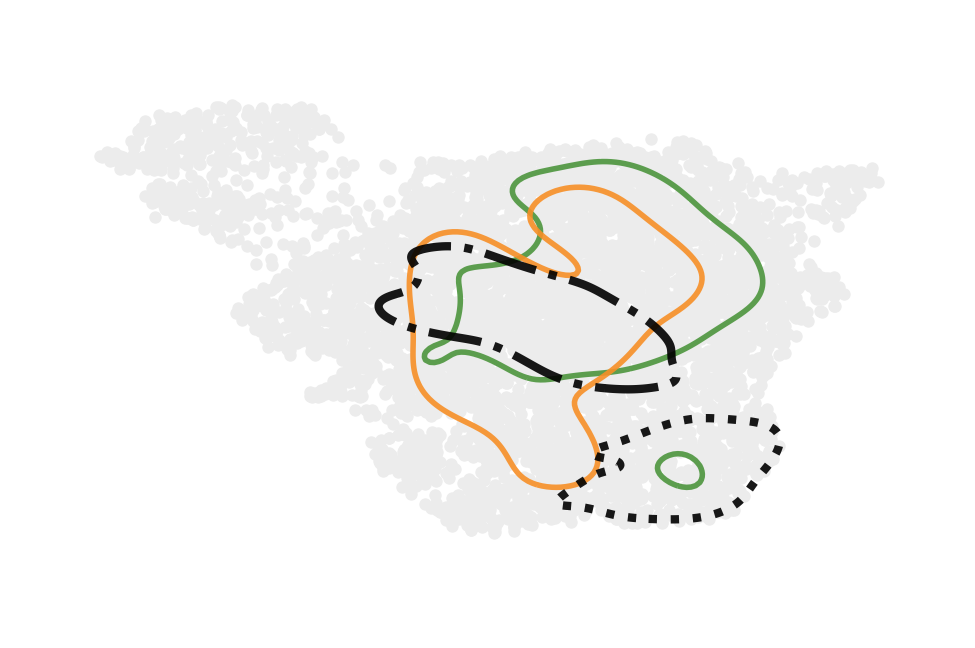

(0.0, 1.0, 0.0, 1.0)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


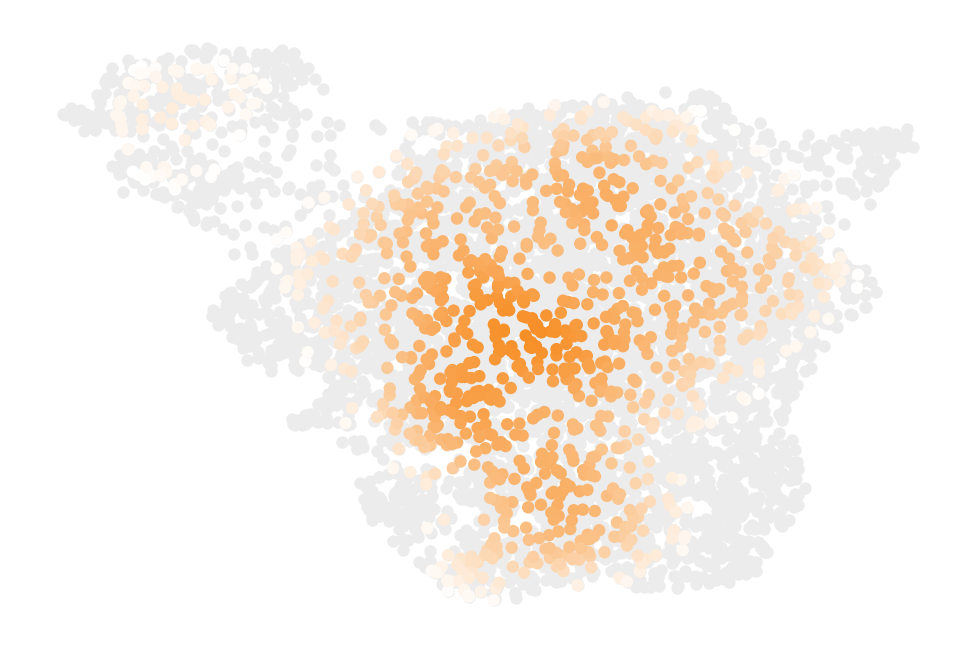

(0.0, 1.0, 0.0, 1.0)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


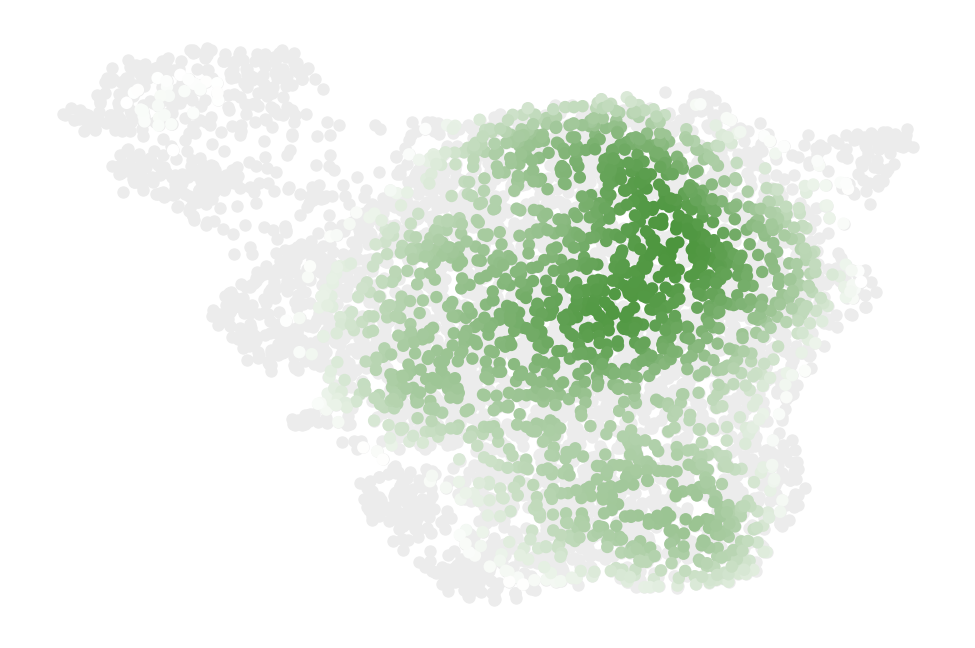

In [15]:
df = cd4.obs
df_umap = df.join(pd.DataFrame(cd4.obsm['X_umap'], index=df.index).rename(columns={0: "UMAP_1", 1: "UMAP_2"}))

pct = 10

def clamp(val, minimum=0, maximum=255):
    if val < minimum:
        return minimum
    if val > maximum:
        return maximum
    return val

def colorscale(hexstr, scalefactor):
    """
    Scales a hex string by ``scalefactor``. Returns scaled hex string.

    To darken the color, use a float value between 0 and 1.
    To brighten the color, use a float value greater than 1.

    >>> colorscale("#DF3C3C", .5)
    #6F1E1E
    >>> colorscale("#52D24F", 1.6)
    #83FF7E
    >>> colorscale("#4F75D2", 1)
    #4F75D2
    """

    hexstr = hexstr.strip('#')

    if scalefactor < 0 or len(hexstr) != 6:
        return hexstr

    r, g, b = int(hexstr[:2], 16), int(hexstr[2:4], 16), int(hexstr[4:], 16)

    r = clamp(r * scalefactor)
    g = clamp(g * scalefactor)
    b = clamp(b * scalefactor)

    return "#%02x%02x%02x" % (r, g, b)



#####################################################
## Sample set #2
sample1='Lean'
base_color1 = '#F78F27'
sample2='Obese'
base_color2 = '#4C953D'

df_background = df_umap[(df_umap['sample']!=sample1) & (df_umap['sample']!=sample2)]

lightener=20
## Pull out sample 1 and filter on sample density
df1 = df_umap.loc[df_umap['sample']==sample1]
df1_thresh = np.percentile(df1.umap_density_sample, pct)
df1 = df1[df1['umap_density_sample'] > df1_thresh]
df1_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [colorscale(base_color1,lightener),base_color1])
## Pull out sample 2 and filter on sample density
df2 = df_umap.loc[df_umap['sample']==sample2]
df2_thresh = np.percentile(df2.umap_density_sample, pct)
df2 = df2[df2['umap_density_sample'] > df2_thresh]
df2_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [colorscale(base_color2,lightener),base_color2])
## Pull out Th2 and Th17-late populations for plotting
df_th2 = df_umap.loc[df_umap['leiden_relabel']=='Th2']
df_th17 = df_umap.loc[(df_umap['leiden_relabel']=='Th17')&(df_umap['Th17cyto']>0)]

## Plotting parameters
size=20
contour_thresh = 0.60
## Plotting function
fig, ax = plt.subplots()
ax.axis("off")
## Plot cluster contours over UMAP space
plt.scatter(df_umap['UMAP_1'], df_umap['UMAP_2'], alpha=1, c=(0.9240551014926518, 0.9240551014926518, 0.9240551014926518, 1.0), s=size, linewidths=0)
sns.kdeplot(df2['UMAP_1'], df2['UMAP_2'], ax=ax, color=base_color2, levels=1, thresh=contour_thresh, alpha=0.9, linewidths=2)
sns.kdeplot(df1['UMAP_1'], df1['UMAP_2'], ax=ax, color=base_color1, levels=1, thresh=contour_thresh, alpha=0.9, linewidths=2)
sns.kdeplot(df_th2['UMAP_1'], df_th2['UMAP_2'], ax=ax, color='black', levels=1, thresh=0.25, alpha=0.9, linestyles="-.", linewidths=3)
sns.kdeplot(df_th17['UMAP_1'], df_th17['UMAP_2'], ax=ax, color='black', levels=1, thresh=0.5, alpha=0.9, linestyles=":", linewidths=3)
# plt.savefig(figdir+'batch2_LeanVsObese_lines3_UMAPdensity_dashDot_noPointColors.pdf')  
plt.show()

size=20
# Plot sample 1 scatterplot
fig, ax = plt.subplots()
ax.axis("off")
plt.scatter(df_umap['UMAP_1'], df_umap['UMAP_2'], alpha=1, c=(0.9240551014926518, 0.9240551014926518, 0.9240551014926518, 1.0), s=size, linewidths=0)
plt.scatter(df1['UMAP_1'], df1['UMAP_2'], alpha=1, c=df1['umap_density_sample'], cmap=df1_cmap, s=size, linewidths=0)
# plt.savefig(figdir+'batch2_'+sample1+'OnlyUMAPdensity.pdf')  
plt.show()
# Plot sample 2 scatterplot
fig, ax = plt.subplots()
ax.axis("off")
# plt.scatter(df_umap['UMAP_1'], df_umap['UMAP_2'], alpha=1, c=(0.9240551014926518, 0.9240551014926518, 0.9240551014926518, 1.0), s=size, linewidths=0)
plt.scatter(df_umap['UMAP_1'], df_umap['UMAP_2'], alpha=1, c=(0.9240551014926518, 0.9240551014926518, 0.9240551014926518, 1.0), s=size, linewidths=0)
plt.scatter(df2['UMAP_1'], df2['UMAP_2'], alpha=1, c=df2['umap_density_sample'], cmap=df2_cmap, s=size, linewidths=0)
# plt.savefig(figdir+'batch2_'+sample2+'OnlyUMAPdensity.pdf')  
plt.show()

## Subset to Th17 cluster to examine distributions

In [16]:
sub = cd4[cd4.obs['leiden_relabel']=='Th17']

[Text(0, 0.5, 'Normalized Sample Density'), Text(0.5, 0, 'UMAP1')]

Text(0.5, 1.0, 'MannwhitneyuResult(statistic=27736.0, pvalue=3.477557509155926e-16)\nKs_2sampResult(statistic=0.3195938661914505, pvalue=1.87960758069039e-13)')

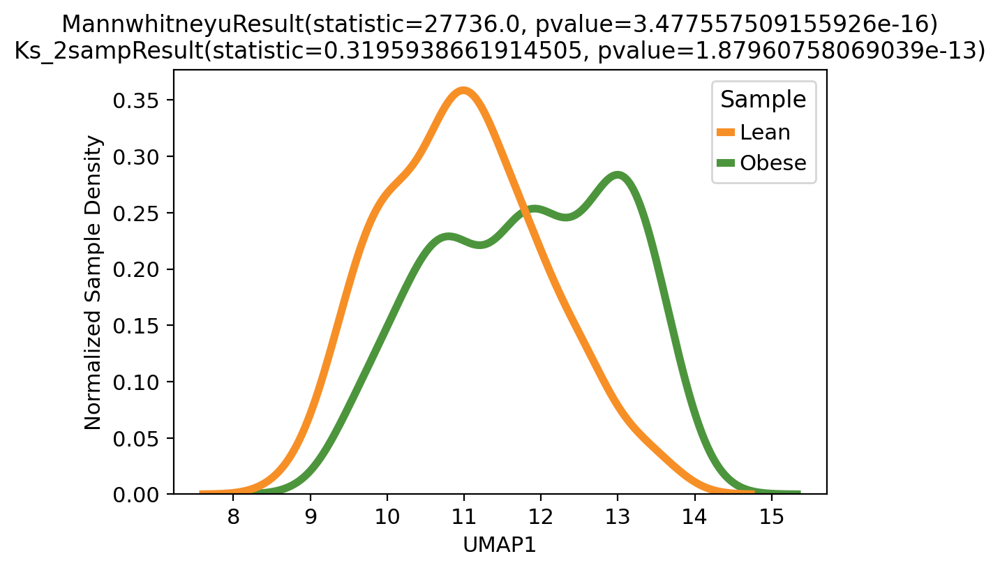

In [17]:
df_th17 = sub.obs[['sample','leiden_relabel']]
df_th17 = df_th17.join(pd.DataFrame(sub.obsm['X_umap'], index=df_th17.index).rename(columns={0: "UMAP_1", 1: "UMAP_2"}))
# df_th17
np.random.seed(500)

## Sample set #2
sample1='Lean'
sample1col = '#F78F27'
sample2='Obese'
sample2col = '#4C953D'

## Plot sample distributions across UMAP1 as proxy for Th17-ness
d1 = df_th17[(df_th17['sample']==sample1)].UMAP_1.to_numpy()
d2 = df_th17[(df_th17['sample']==sample2)].UMAP_1.to_numpy()
title=str(stats.mannwhitneyu(d1,d2))+'\n'+str(stats.ks_2samp(d1,d2))
df = pd.DataFrame({'Sample':sample1,'Metric':d1}).append(pd.DataFrame({'Sample':sample2,'Metric':d2}))
fig,ax = plt.subplots()
ax = sns.kdeplot(data=df, x='Metric', hue='Sample', common_norm=False, palette=[sample1col,sample2col], linewidth=4)
ax.set(xlabel='UMAP1', ylabel='Normalized Sample Density')
plt.title(title)
# plt.savefig(figdir+'batch2_LeanVsObese_umap1Histograms_MannWhitUpval_'+str('{:0.3e}'.format(stats.mannwhitneyu(d1,d2)[1]))+'.pdf')
plt.show()

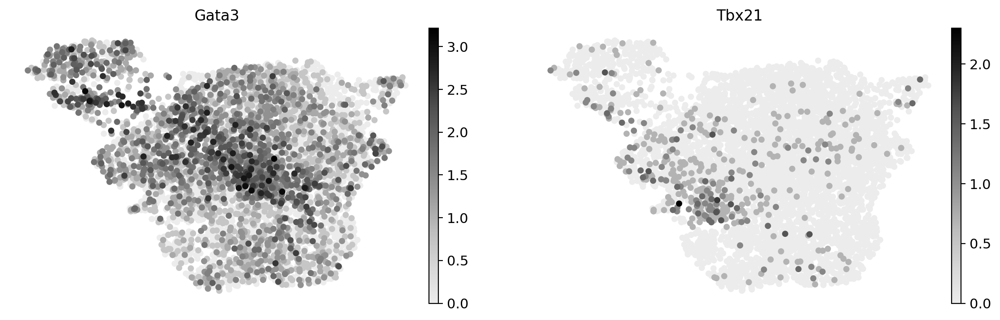

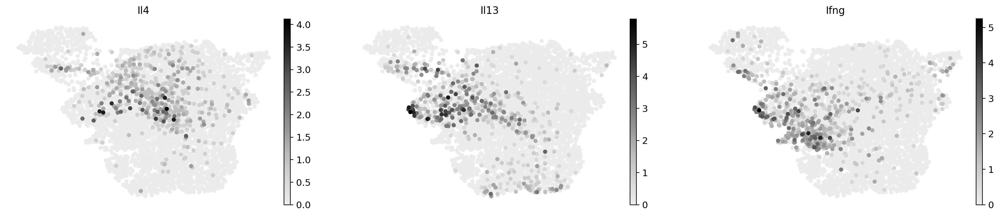

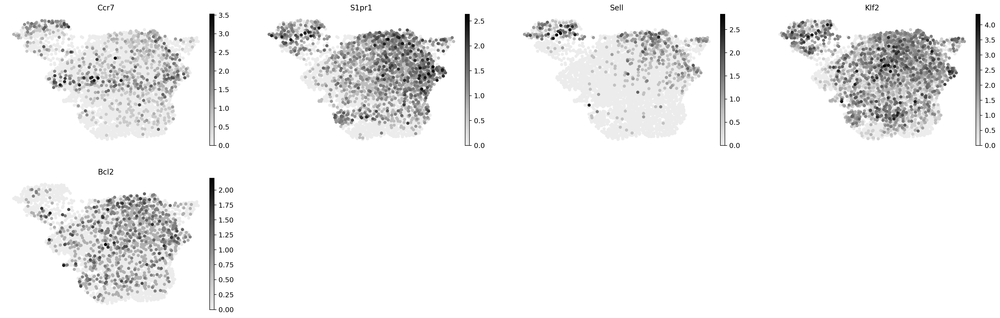

In [18]:
cmapBig = cm.get_cmap('Greys', 512)
newcmp = ListedColormap(cmapBig(np.linspace(0.15, 1, 256)))

tfs = ['Gata3', 'Tbx21']
cytokines = ['Il4', 'Il13', 'Ifng']
other = ['Ccr7', 'S1pr1', 'Sell', 'Klf2', 'Bcl2']
sc.pl.umap(cd4, color=tfs, frameon=False, legend_loc='right', size=100, cmap=newcmp)
sc.pl.umap(cd4, color=cytokines, frameon=False, legend_loc='right', size=100, cmap=newcmp)
sc.pl.umap(cd4, color=other, frameon=False, legend_loc='right', size=100, cmap=newcmp)

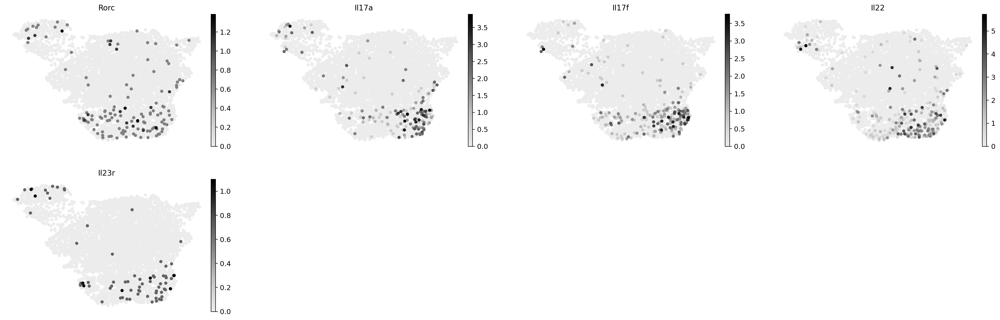

In [19]:
forPub = ['Rorc', 'Il17a', 'Il17f', 'Il22', 'Il23r']
cmapBig = cm.get_cmap('Greys', 512)
newcmp = ListedColormap(cmapBig(np.linspace(0.15, 1, 256)))

sc.pl.umap(cd4, color=forPub, frameon=False, legend_loc='right', size=100, cmap=newcmp)

## Integrating PPARG ChIP-Seq

In [20]:
chip = pd.read_csv('annotated_PPARg_exPPARg_RIPA_peaks.txt', sep='\t')
chip_paper = chip[chip['Peak Score']>np.quantile(chip['Peak Score'],0.5)]
# chip_paper[['Gene Name']].drop_duplicates().to_csv(figdir+'annotated_PPARg_exPPARg_RIPA_peaks_0.5quantile.txt', sep='\t')
chip_genes = chip_paper['Gene Name']
chip_genes = chip_genes[chip_genes.isin(cd4.var_names)]

In [21]:
sc.tl.score_genes(cd4, gene_list = chip_genes, ctrl_size=len(chip_genes), score_name='Pparg_ChIP_Score', use_raw=True)

(0.0, 1.0, 0.0, 1.0)

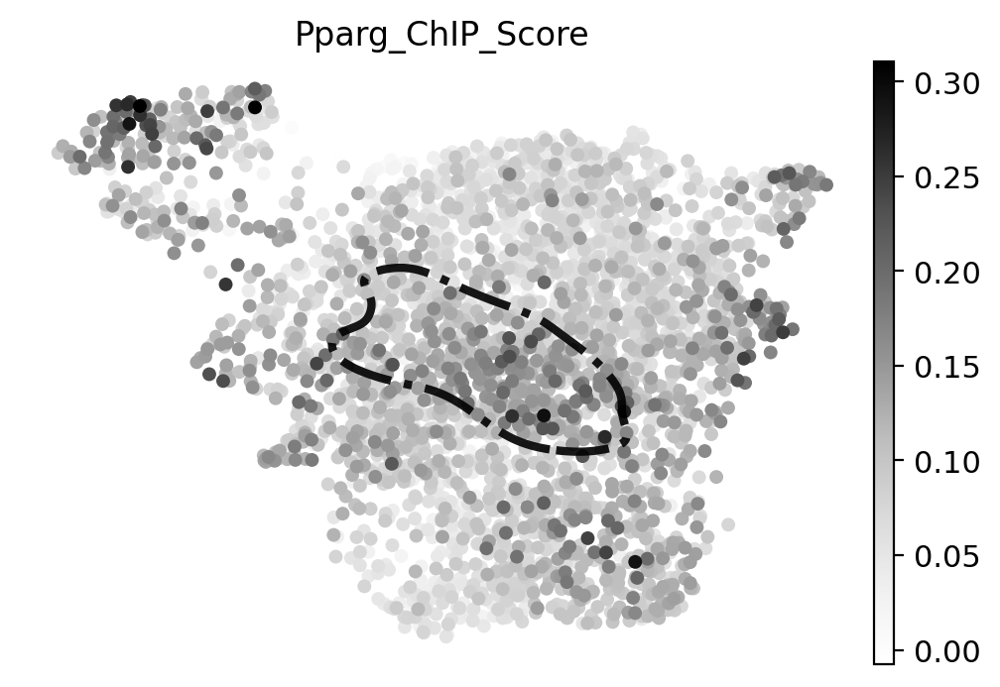

In [22]:
df = cd4.obs
df_umap = df.join(pd.DataFrame(cd4.obsm['X_umap'], index=df.index).rename(columns={0: "UMAP_1", 1: "UMAP_2"}))

pct = 10
# Pull out Th2 cells to outline cluster
df_th2 = df_umap.loc[df_umap['leiden_relabel']=='Th2']

## Plotting parameters
size=20
## Plotting function
# Plot Lean & Obese scatterplot colored by PPARG ChIP score, including Th2 outline
fig, ax = plt.subplots()
ax.axis("off")
sc.pl.umap(cd4[(cd4.obs['sample']=='Lean')|(cd4.obs['sample']=='Obese')], color='Pparg_ChIP_Score', frameon=False, legend_loc='right', size=100, cmap='Greys', ax=ax, show=False)
sns.kdeplot(df_th2['UMAP_1'], df_th2['UMAP_2'], ax=ax, color='black', levels=1, thresh=0.25, alpha=0.9, linestyles="-.", linewidths=3)
# plt.savefig(figdir+'batch2_LeanVsObese_PpargScore_Th2outline.pdf')  
plt.show()

## Repeat plots with second sample set

(0.0, 1.0, 0.0, 1.0)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


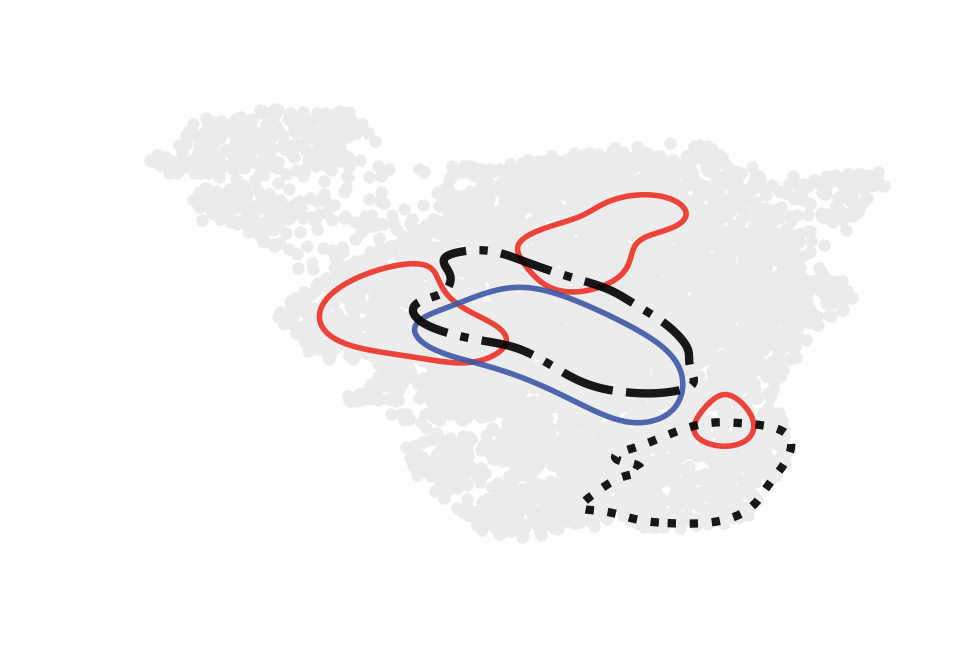

(0.0, 1.0, 0.0, 1.0)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


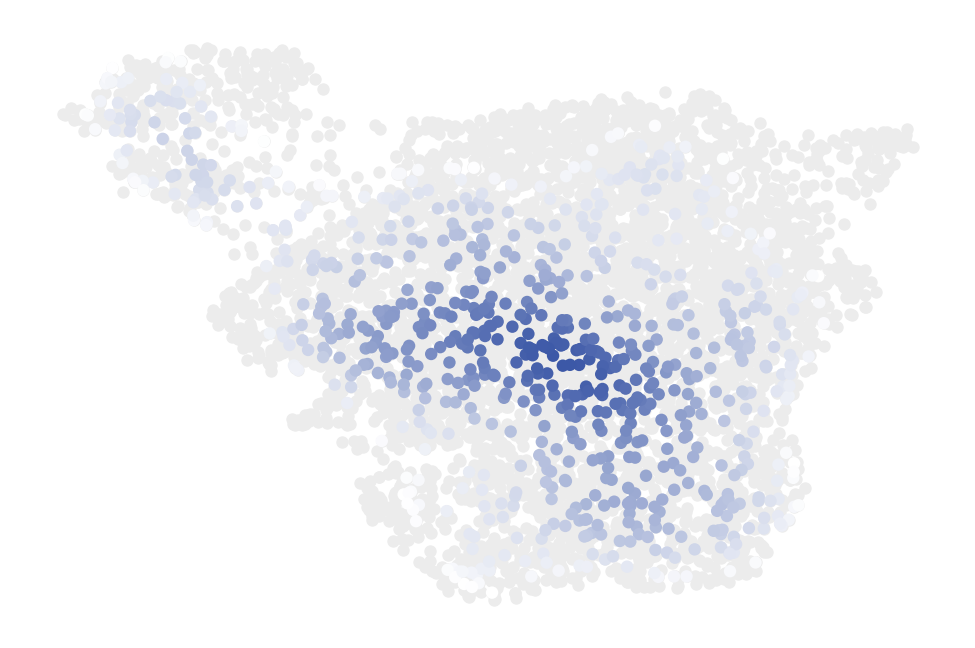

(0.0, 1.0, 0.0, 1.0)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


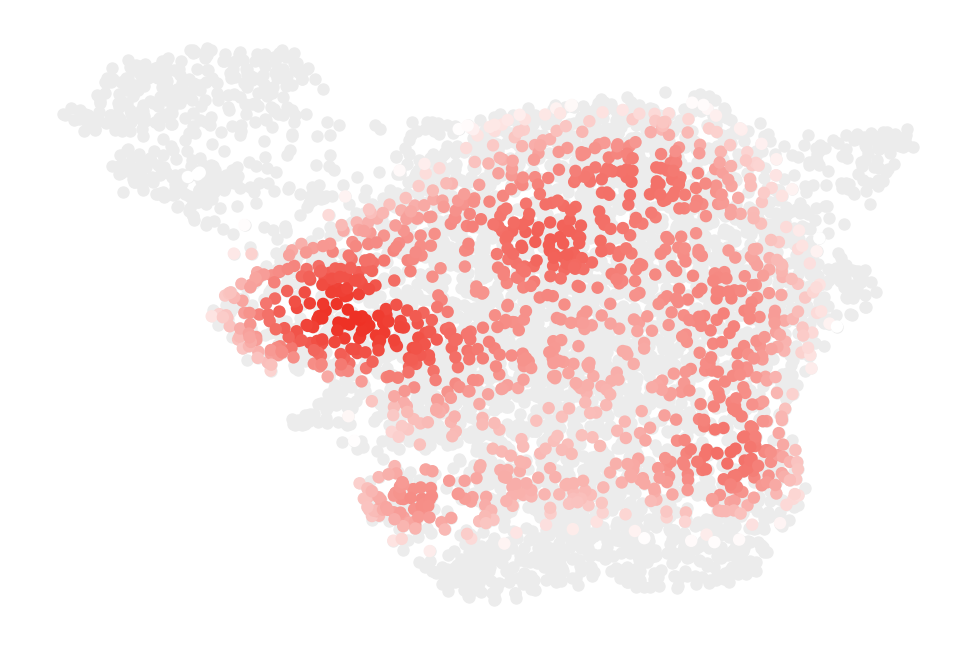

In [23]:
df = cd4.obs
df_umap = df.join(pd.DataFrame(cd4.obsm['X_umap'], index=df.index).rename(columns={0: "UMAP_1", 1: "UMAP_2"}))

pct = 10

def clamp(val, minimum=0, maximum=255):
    if val < minimum:
        return minimum
    if val > maximum:
        return maximum
    return val

def colorscale(hexstr, scalefactor):
    """
    Scales a hex string by ``scalefactor``. Returns scaled hex string.

    To darken the color, use a float value between 0 and 1.
    To brighten the color, use a float value greater than 1.

    >>> colorscale("#DF3C3C", .5)
    #6F1E1E
    >>> colorscale("#52D24F", 1.6)
    #83FF7E
    >>> colorscale("#4F75D2", 1)
    #4F75D2
    """

    hexstr = hexstr.strip('#')

    if scalefactor < 0 or len(hexstr) != 6:
        return hexstr

    r, g, b = int(hexstr[:2], 16), int(hexstr[2:4], 16), int(hexstr[4:], 16)

    r = clamp(r * scalefactor)
    g = clamp(g * scalefactor)
    b = clamp(b * scalefactor)

    return "#%02x%02x%02x" % (r, g, b)

#####################################################
## Sample set #2
sample1 = 'CD4-Cre'
base_color1="#3C58A7"
sample2 = 'PPARgTKO'
base_color2="#EE3125"

## Pull out cells not in samples 1 or 2 for background plotting
df_background = df_umap[(df_umap['sample']!=sample1) & (df_umap['sample']!=sample2)]
lightener=20
## Pull out sample 1 and filter on sample density
df1 = df_umap.loc[df_umap['sample']==sample1]
df1_thresh = np.percentile(df1.umap_density_sample, pct)
df1 = df1[df1['umap_density_sample'] > df1_thresh]
df1_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [colorscale(base_color1,lightener),base_color1])
## Pull out sample 2 and filter on sample density
df2 = df_umap.loc[df_umap['sample']==sample2]
df2_thresh = np.percentile(df2.umap_density_sample, pct)
df2 = df2[df2['umap_density_sample'] > df2_thresh]
df2_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", [colorscale(base_color2,lightener),base_color2])
## Pull out Th2 and Th17-late populations for plotting
df_th2 = df_umap.loc[df_umap['leiden_relabel']=='Th2']
df_th17 = df_umap.loc[(df_umap['leiden_relabel']=='Th17')&(df_umap['Th17cyto']>0)]

## Plotting parameters
size=20
contour_thresh = 0.8
## Plotting function
## Plot cluster contours over UMAP space
fig, ax = plt.subplots()
ax.axis("off")
plt.scatter(df_umap['UMAP_1'], df_umap['UMAP_2'], alpha=1, c=(0.9240551014926518, 0.9240551014926518, 0.9240551014926518, 1.0), s=size, linewidths=0)
sns.kdeplot(df2['UMAP_1'], df2['UMAP_2'], ax=ax, color=base_color2, levels=1, thresh=contour_thresh, alpha=0.9, linewidths=2)
sns.kdeplot(df1['UMAP_1'], df1['UMAP_2'], ax=ax, color=base_color1, levels=1, thresh=contour_thresh, alpha=0.9, linewidths=2)
sns.kdeplot(df_th2['UMAP_1'], df_th2['UMAP_2'], ax=ax, color='black', levels=1, thresh=0.25, alpha=0.9, linestyles="-.", linewidths=3)
sns.kdeplot(df_th17['UMAP_1'], df_th17['UMAP_2'], ax=ax, color='black', levels=1, thresh=0.5, alpha=0.9, linestyles=":", linewidths=3)
# plt.savefig(figdir+'batch2_CtrlVsTko_lines3_UMAPdensity_dashDot_noPointColors.pdf')  
plt.show()

size=20
## Plot sample1 scatterplot
fig, ax = plt.subplots()
ax.axis("off")
plt.scatter(df_umap['UMAP_1'], df_umap['UMAP_2'], alpha=1, c=(0.9240551014926518, 0.9240551014926518, 0.9240551014926518, 1.0), s=size, linewidths=0)
plt.scatter(df1['UMAP_1'], df1['UMAP_2'], alpha=1, c=df1['umap_density_sample'], cmap=df1_cmap, s=size, linewidths=0)
# plt.savefig(figdir+'batch2_TkoOnlyUMAPdensity.pdf')  
plt.show()
## Plot sample2 scatterplot
fig, ax = plt.subplots()
ax.axis("off")
plt.scatter(df_umap['UMAP_1'], df_umap['UMAP_2'], alpha=1, c=(0.9240551014926518, 0.9240551014926518, 0.9240551014926518, 1.0), s=size, linewidths=0)
plt.scatter(df2['UMAP_1'], df2['UMAP_2'], alpha=1, c=df2['umap_density_sample'], cmap=df2_cmap, s=size, linewidths=0)
# plt.savefig(figdir+'batch2_'+sample2+'OnlyUMAPdensity.pdf')  
plt.show()

## Subset to Th17 cluster to examine distributions

[Text(0, 0.5, 'Normalized Sample Density'), Text(0.5, 0, 'UMAP1')]

Text(0.5, 1.0, 'MannwhitneyuResult(statistic=21459.0, pvalue=0.007101268994879814)\nKs_2sampResult(statistic=0.13758064516129032, pvalue=0.026829921116223288)')

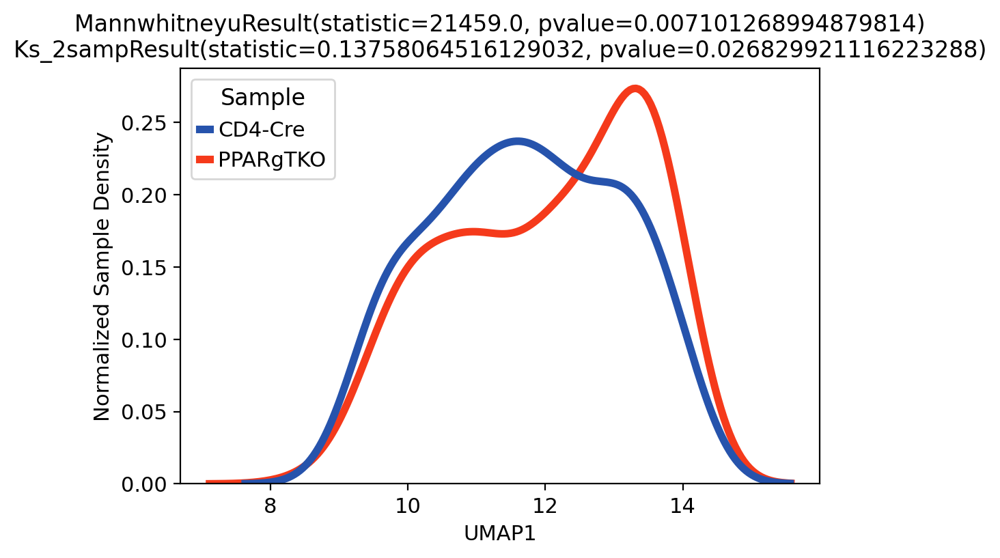

In [24]:
df_th17 = sub.obs[['sample','leiden_relabel']]
df_th17 = df_th17.join(pd.DataFrame(sub.obsm['X_umap'], index=df_th17.index).rename(columns={0: "UMAP_1", 1: "UMAP_2"}))

## Sample set #2
sample1='CD4-Cre'
sample1col = '#2653AC'
sample2='PPARgTKO'
sample2col = '#F53A1B'

## Plot sample distributions across UMAP1 as proxy for Th17-ness
d1 = df_th17[(df_th17['sample']==sample1)].UMAP_1.to_numpy()
d2 = df_th17[(df_th17['sample']==sample2)].UMAP_1.to_numpy()
title=str(stats.mannwhitneyu(d1,d2))+'\n'+str(stats.ks_2samp(d1,d2))
df = pd.DataFrame({'Sample':sample1,'Metric':d1}).append(pd.DataFrame({'Sample':sample2,'Metric':d2}))
fig,ax = plt.subplots()
ax = sns.kdeplot(data=df, x='Metric', hue='Sample', common_norm=False, palette=[sample1col,sample2col], linewidth=4)
ax.set(xlabel='UMAP1', ylabel='Normalized Sample Density')
plt.title(title)
# plt.savefig(figdir+'batch2_CreTKO_umap1Histograms_MannWhitUpval_'+str('{:0.3e}'.format(stats.mannwhitneyu(d1,d2)[1]))+'.pdf')
plt.show()

In [ ]:
## Done